# **Setup**

**Reference**
* https://www.youtube.com/watch?v=AxIc-vGaHQ0&list=PLB9cczsBXUdlym1iH_wJXy1qutx7H42Uh&index=58&t=1s

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
import cv2

from glob import glob 
from IPython.display import Video
from tqdm.notebook import tqdm 

import subprocess

# **Video Data Basics**

## **Resolution**

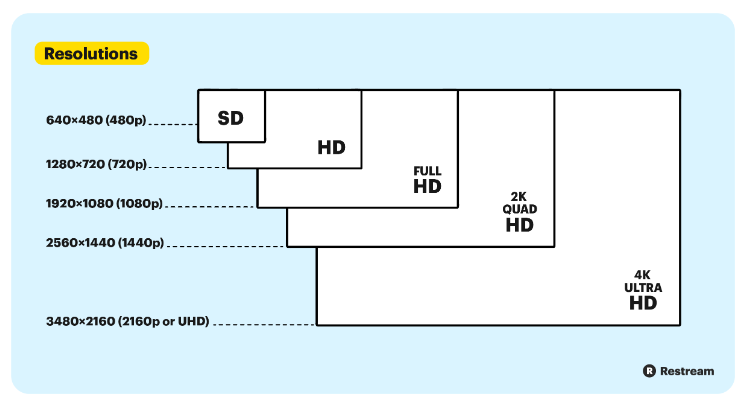

## **Frame Rate**

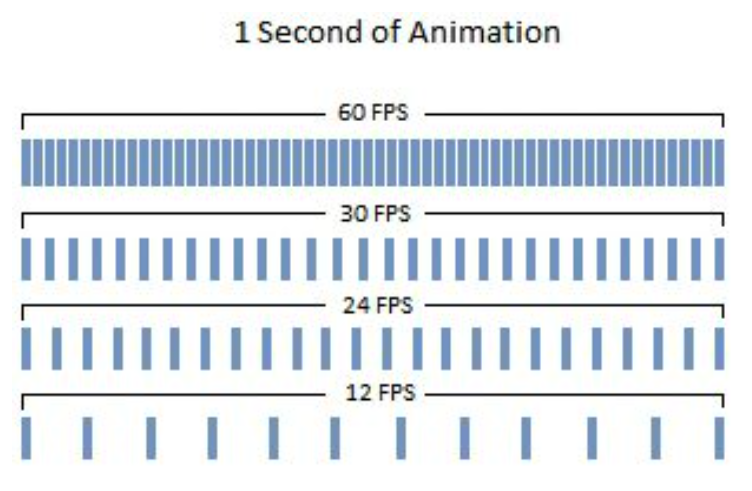

# **Visualize A Video**

In [2]:
Video1_File_Name = '00067cfb-e535423e.mov'
Video(Video1_File_Name,width=600,height=400)

# **Video Formation Conversion**

* From MOV to MP4
* FFMPEG Documentation: https://ffmpeg.org/

In [3]:
input_file = '0000f77c-6257be58.mov'
# subprocess.run(['ffmpeg','-i',input_file,'-qscale','0','026c7465-309f6d33.mp4','-loglevel','quiet'])

# **Video Metadata**

In [4]:
# Load in video capture
cap = cv2.VideoCapture(Video1_File_Name)

In [5]:
# Get Frame Count
video1_frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
video1_frame_count

1206

In [6]:
# Get Frame Rate
video1_FPS = int(cap.get(cv2.CAP_PROP_FPS))
video1_FPS

60

In [7]:
# Video Frame Dimensions
video1_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)) 
video1_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

print(video1_width,video1_height)

1280 720


In [8]:
# Close Video File
cap.release()

# **Get Video Frames**

## **Get Video Frame**

In [9]:
cap = cv2.VideoCapture(Video1_File_Name)

# Get Video Frame Size
ret, img = cap.read()
print('Image Access Status: ',ret)
print('Frame Size: ',img.shape)

Image Access Status:  True
Frame Size:  (720, 1280, 3)


In [10]:
print(type(img))
img[:10,:10,0]

<class 'numpy.ndarray'>


array([[37, 37, 36, 36, 33, 31, 31, 27, 24, 24],
       [43, 43, 41, 40, 40, 40, 42, 42, 34, 33],
       [41, 41, 40, 39, 39, 39, 41, 45, 41, 40],
       [34, 34, 33, 32, 32, 32, 36, 39, 40, 40],
       [33, 33, 32, 32, 31, 31, 33, 37, 35, 36],
       [26, 26, 26, 26, 25, 26, 26, 31, 30, 31],
       [26, 26, 26, 26, 27, 27, 28, 29, 29, 29],
       [29, 29, 29, 31, 31, 31, 32, 32, 29, 29],
       [26, 26, 26, 27, 27, 29, 32, 32, 30, 27],
       [27, 27, 27, 28, 28, 27, 25, 26, 25, 26]], dtype=uint8)

## **Display Video Frame**

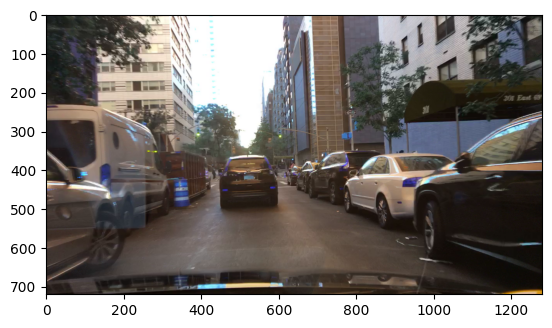

In [11]:
# Display Image Using Matplotlib
plt.imshow(img)

In [12]:
# Display Image Using OpenCV
cv2.imshow('Image',img)     # Open in Separate Window
cv2.waitKey(0)
cv2.destroyAllWindows()

## **Function To Convert & Display Image**

In [13]:
# Plot OpenCV Images 
def display_cv2_img(img,figsize=(6,6)):
    img_RGB = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_RGB)
    ax.axis('off')

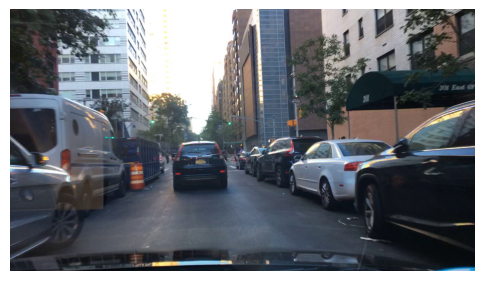

In [14]:
display_cv2_img(img)

In [15]:
cap.release()

## **Display Multiple Frames**

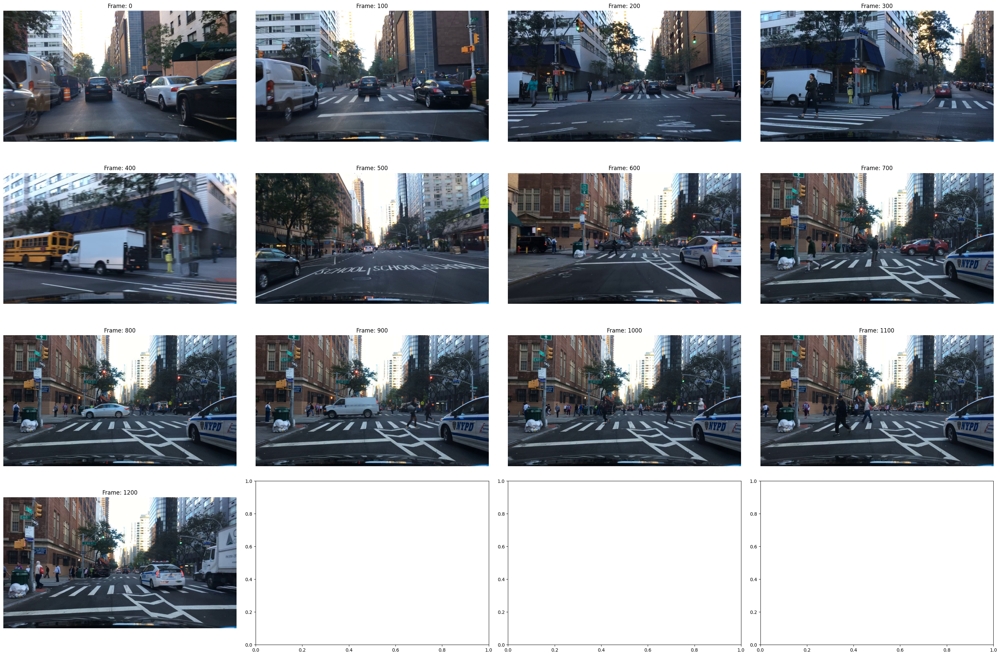

In [16]:
fig,axs = plt.subplots(4,4,figsize=(30,20))
axs = axs.flatten() # Convert axs from Array To List
# plt.show()

# Load Video File
cap = cv2.VideoCapture(Video1_File_Name)
n_frame = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
# Iterate Over Each Frame
for frame in range(n_frame):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

# **Add Annotations**

## **Extract ZIP File**

In [17]:
import os
from zipfile import ZipFile
def unzip_file(file_path, extract_path):
    with ZipFile(file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)


In [18]:
unzip_file('Input Data/mot_labels.csv.zip','Input Data')

## **Get Label Data**

In [19]:
labels = pd.read_csv('Input Data/mot_labels.csv',low_memory=False)

print(labels.shape)
labels.head()

(2890846, 13)


,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
0,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89537.0,car,False,True,False,825.173210,1003.094688,355.011547,418.198614,True
1,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89538.0,car,False,True,False,484.295612,700.461894,346.697460,424.849885,True
2,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89539.0,pedestrian,False,True,False,645.588915,663.879908,338.383372,358.337182,True
3,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89540.0,car,False,False,False,120.969977,192.471132,359.168591,409.053118,True
4,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89541.0,car,False,False,False,251.501155,315.519630,354.180139,400.739030,True


## **Get Video Label Data**

In [20]:
Video1_File_Name.split('.')

['00067cfb-e535423e', 'mov']

In [21]:
# Filter Labels For Video File
Video_Labels = labels[labels['videoName']== Video1_File_Name.split('.')[0]]

print(Video_Labels.shape)
Video_Labels.head()

(4012, 13)


,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
1067283,00067cfb-e535423e-0000001.jpg,00067cfb-e535423e,0,98043.0,car,False,False,True,0.000000,204.068127,346.084152,686.197735,True
1067284,00067cfb-e535423e-0000001.jpg,00067cfb-e535423e,0,98044.0,car,False,False,True,941.910163,1278.678389,244.731416,676.000478,True
1067285,00067cfb-e535423e-0000001.jpg,00067cfb-e535423e,0,98045.0,car,False,True,True,0.000000,330.449131,228.995869,574.685085,True
1067286,00067cfb-e535423e-0000001.jpg,00067cfb-e535423e,0,98046.0,car,False,True,False,759.772834,1053.422813,359.093961,552.382555,True
1067287,00067cfb-e535423e-0000001.jpg,00067cfb-e535423e,0,98047.0,car,False,True,False,674.344023,869.426940,344.225608,492.244898,True


In [22]:
# Label Counts
Video_Labels['category'].value_counts()

category
pedestrian       2347
car              1245
bus               146
truck             124
other vehicle     122
bicycle            18
rider              10
Name: count, dtype: int64

## **Get Last Frame With Annotations**

In [23]:
Video_Labels['frameIndex'].max()

201

## **Get Frame With Highest Label Count**

In [24]:
# Frame With Highest Label Count
Video_Labels['frameIndex'].value_counts().head(5).index

Index([162, 161, 160, 170, 169], dtype='int64', name='frameIndex')

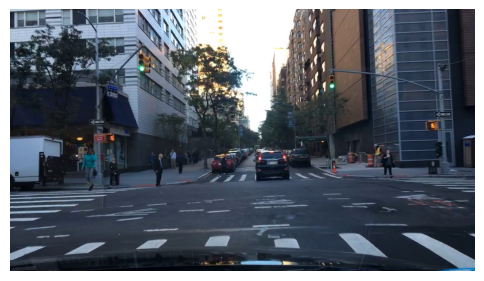

In [25]:
# Get Frame Index With Highest Label Count
frame_idx_highest_label = Video_Labels['frameIndex'].value_counts().head(5).index[3]

# Load Video File
cap = cv2.VideoCapture(Video1_File_Name)
n_frame = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
# Iterate Over Each Frame
for frame in range(n_frame):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == frame_idx_highest_label:
        break
cap.release()

# Display Image
display_cv2_img(img)

## **Get Frame Labels**

In [26]:
frame_labels = Video_Labels[Video_Labels['frameIndex']== frame_idx_highest_label]

print(frame_labels.shape)
frame_labels.head()

(33, 13)


,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
1070520,00067cfb-e535423e-0000171.jpg,00067cfb-e535423e,170,98101.0,car,False,False,True,1001.925052,1280.000000,313.722736,643.115577,True
1070521,00067cfb-e535423e-0000171.jpg,00067cfb-e535423e,170,98207.0,pedestrian,False,False,False,785.597668,842.073580,338.062347,494.344023,True
1070522,00067cfb-e535423e-0000171.jpg,00067cfb-e535423e,170,98211.0,pedestrian,False,True,False,926.239067,978.057930,347.586543,480.699708,True
1070523,00067cfb-e535423e-0000171.jpg,00067cfb-e535423e,170,98198.0,pedestrian,False,False,False,440.291545,493.819242,356.851312,494.344023,True
1070524,00067cfb-e535423e-0000171.jpg,00067cfb-e535423e,170,98131.0,pedestrian,False,False,False,241.953800,278.008635,375.111755,454.214261,True


In [27]:
# Loop Over All The Frame Labels
for i,d in frame_labels.iterrows():
    break
    # cv2.rectangle(img,)

# Sample Frame Label Row
print(d)

# Annotation Box Point 01
pt1 = (int(d['box2d.x1']),int(d['box2d.y1']))
pt2 = (int(d['box2d.x2']),int(d['box2d.y2']))

print('\n')
print('Annotation Box Point 01: ',pt1)
print('Annotation Box Point 02: ',pt2)

name                    00067cfb-e535423e-0000171.jpg
videoName                           00067cfb-e535423e
frameIndex                                        170
id                                            98101.0
category                                          car
attributes.crowd                                False
attributes.occluded                             False
attributes.truncated                             True
box2d.x1                                  1001.925052
box2d.x2                                       1280.0
box2d.y1                                   313.722736
box2d.y2                                   643.115577
haveVideo                                        True
Name: 1070520, dtype: object


Annotation Box Point 01:  (1001, 313)
Annotation Box Point 02:  (1280, 643)


## **Add Frame Annotation Box**

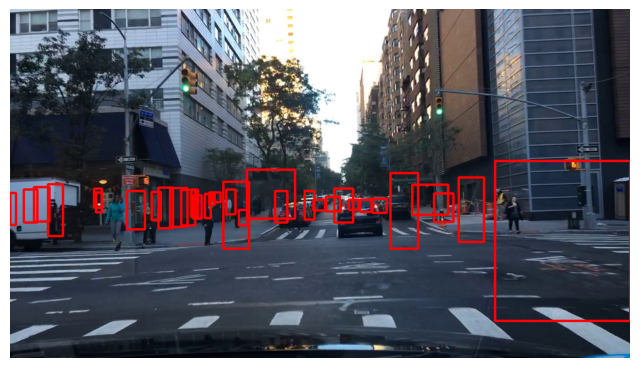

In [28]:
for i,d in frame_labels.iterrows():   
    point_01 = (int(d['box2d.x1']),int(d['box2d.y1']))
    point_02 = (int(d['box2d.x2']),int(d['box2d.y2']))
    cv2.rectangle(img, point_01, point_02,(0,0,255),3)

display_cv2_img(img,figsize=(8,8))

## **Category Wise Annotation Colors**

In [29]:
frame_labels['category'].unique()

array(['car', 'pedestrian', 'other vehicle', 'bus', 'truck'], dtype=object)

In [30]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

## **Add Frame Annotations Box**
* Category Wise Annotation

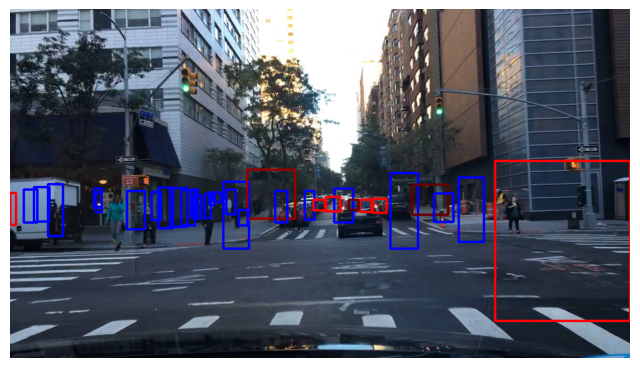

In [31]:
for i,d in frame_labels.iterrows():   
    point_01 = (int(d['box2d.x1']),int(d['box2d.y1']))
    point_02 = (int(d['box2d.x2']),int(d['box2d.y2']))
    color = color_map[d['category']]
    cv2.rectangle(img, point_01, point_02,color,3)

display_cv2_img(img,figsize=(8,8))

## **Add Frame Annotation Text** 

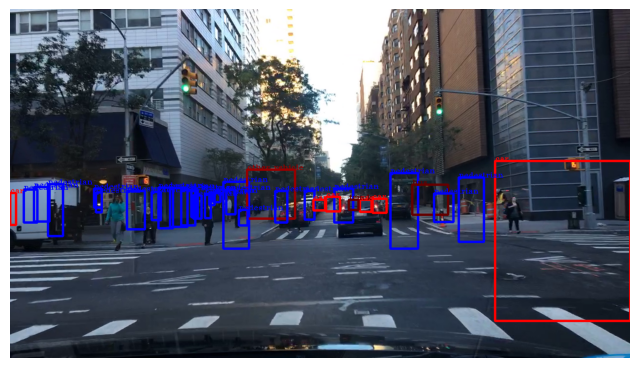

In [32]:
# Specify Font
font = cv2.FONT_HERSHEY_TRIPLEX

for i,d in frame_labels.iterrows():   
    point_01 = (int(d['box2d.x1']),int(d['box2d.y1']))
    point_02 = (int(d['box2d.x2']),int(d['box2d.y2']))
    color = color_map[d['category']]
    img = cv2.rectangle(img, point_01, point_02,color,3)

    # Add Text
    text_loc = (int(d['box2d.x1']),int(d['box2d.y1']))
    img = cv2.putText(img,d['category'],text_loc,font,fontScale=0.5,color=color)

display_cv2_img(img,figsize=(8,8))
cap.release()

# **Define Annotation Function**
For Annotating Frames

In [33]:
Video_Labels.columns

Index(['name', 'videoName', 'frameIndex', 'id', 'category', 'attributes.crowd',
       'attributes.occluded', 'attributes.truncated', 'box2d.x1', 'box2d.x2',
       'box2d.y1', 'box2d.y2', 'haveVideo'],
      dtype='object')

In [34]:
Video_Labels.head(2)

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
1067283,00067cfb-e535423e-0000001.jpg,00067cfb-e535423e,0,98043.0,car,False,False,True,0.000000,204.068127,346.084152,686.197735,True
1067284,00067cfb-e535423e-0000001.jpg,00067cfb-e535423e,0,98044.0,car,False,False,True,941.910163,1278.678389,244.731416,676.000478,True


In [35]:
def add_annotations(img, frame, video_labels):
    
    # Identify the Latest Frame With Available Annotations 
    max_frame = video_labels.query("frameIndex <= @frame")["frameIndex"].max()
    frame_labels = video_labels.query("frameIndex == @max_frame")
    
    for i, d in frame_labels.iterrows():
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
        color = color_map[d["category"]]
        img = cv2.rectangle(img, pt1, pt2, color, 3)
    return img

# **Add Video Annotations**

In [37]:
# Load Video & get Metadata
Video1_File_Name = '00067cfb-e535423e.mov'
cap = cv2.VideoCapture(Video1_File_Name)
video1_frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
video1_FPS = int(cap.get(cv2.CAP_PROP_FPS))
video1_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)) 
video1_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
Video_Labels = labels[labels['videoName']== Video1_File_Name.split('.')[0]]
video1_max_frame_with_label = Video_Labels['frameIndex'].max()

# Diagnostics
print('Video Frame Count: ',video1_frame_count)
print('Last Frame With Labels: ',video1_max_frame_with_label)

# Specify Codec
Video_Codec = 'MP4V'

# Output File Name
Output_File_Name = Video1_File_Name.split('.')[0] + '_Annotated.mp4' 

Output_Data = cv2.VideoWriter(Output_File_Name,
                cv2.VideoWriter_fourcc(*Video_Codec),
                fps = video1_FPS, frameSize=(video1_width,video1_height))

for frame in tqdm(range(video1_frame_count) ,total = video1_frame_count):
    ret,img = cap.read()
    if ret == False:
        break
    else:
        # Add Annotation Using Pre-Defined Functions
        if frame <= video1_max_frame_with_label:    # Add Annotations Only If Available
            img = add_annotations(img,frame,Video_Labels)
        else:
            pass
    Output_Data.write(img)
Output_Data.release()
cap.release()

Video Frame Count:  1206
Last Frame With Labels:  201


  0%|          | 0/1206 [00:00<?, ?it/s]